In [24]:
import os
import os.path as op
import numpy as np
import mne
import matplotlib.pyplot as plt

**Read the raw data**

In [25]:
dir1 = '1'
dir2 = '2'
vhdr_file = op.join('../data/Raw_data', dir2, 'driving_EEG.vhdr')
raw = mne.io.read_raw_brainvision(vhdr_file, misc='auto')
raw.load_data()
# raw.info

Extracting parameters from ../data/Raw_data\2\driving_EEG.vhdr...
Setting channel info structure...
Reading 0 ... 568559  =      0.000 ...   568.559 secs...


<RawBrainVision | driving_EEG.eeg, 63 x 568560 (568.6 s), ~273.4 MB, data loaded>

**View the raw data**，including topological distribution of electrodes and PSD at different frequency bands

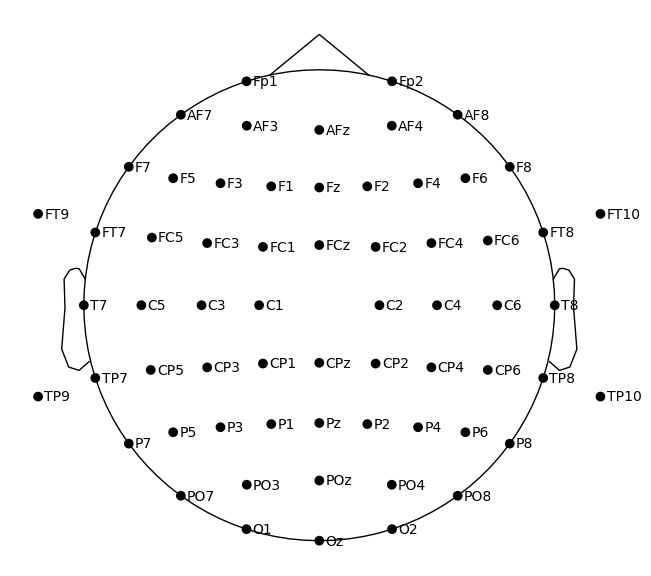

In [26]:
#matplotlib inline
raw.plot_sensors(kind='topomap', show_names=True) #topomap or 3d
plt.show()

In [27]:
# Electrode grouping
midline = ["AFz", "Fz", "FCz", "CPz", "Pz", "POz", "Oz"]
Frontal_poles = ["Fp1", "Fp2"]
Anterior_Frontal = ["AFz", "AF3", "AF4", "AF7", "AF8"]
Frontal_lobes = ["Fz", "F1", "F2", "F3", "F4", "F5", "F6", "F7", "F8", "FCz", "FC1", "FC2", "FC3", "FC4", "FC5", "FC6", "FT7", "FT8", "FT9", "FT10"]
Temporal_lobes = ["T7", "T8", "TP7", "TP8", "FT7", "FT8", "TP9", "TP10", "FT9", "FT10"]
Central_poles = ["FCz", "FC1", "FC2", "FC3", "FC4", "FC5", "FC6", "C1", "C2", "C3", "C4", "C5", "C6", "CPz", "CP1", "CP2", "CP3", "CP4", "CP5", "CP6"]
Parietal_lobes = ["CPz", "CP1", "CP2", "CP3", "CP4", "CP5", "CP6", "P1", "P2", "P3", "P4", "P5", "P6", "P7", "P8", "POz", "PO3", "PO4", "PO7", "PO8"]
Occipital_lobes = ["Oz", "O1", "O2", "POz", "PO3", "PO4", "PO7", "PO8"]

Effective window size : 2.048 (s)
Plotting amplitude spectral density (dB=True).


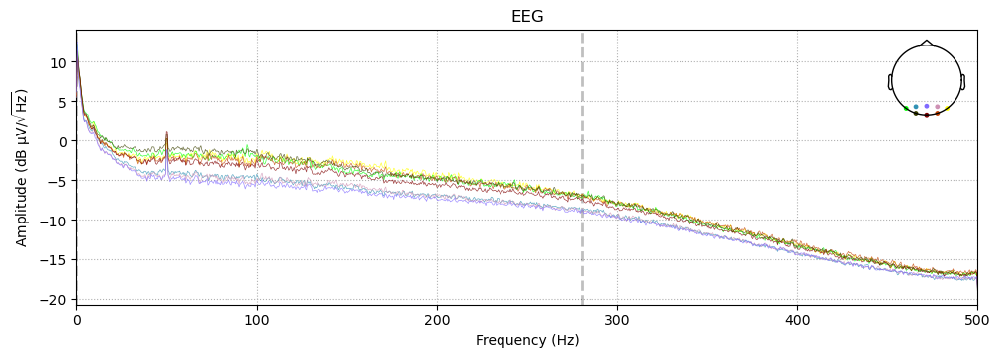

In [28]:
spectrum = raw.copy().compute_psd()
spectrum.plot(picks=Occipital_lobes, amplitude=True, show=False)
plt.show()

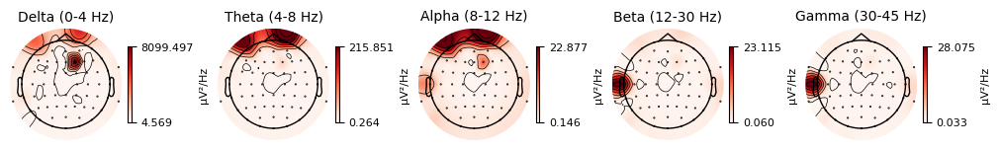

In [29]:
#matplotlib inline
spectrum.plot_topomap()
plt.show()

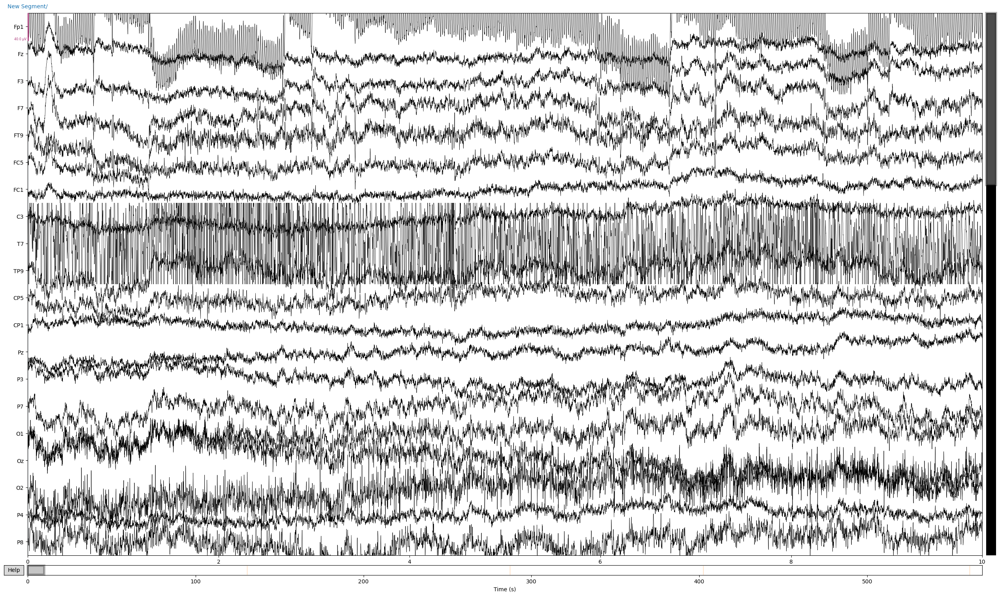

In [30]:
# Using "#matplotlib qt" to show the plot in the interactive window
raw.plot()
plt.show()

**data preprocessing**

In [31]:
raw.resample(256, npad="auto")
raw.filter(0.1, 75, fir_design='firwin', picks=['eeg'])

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 75 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 75.00 Hz
- Upper transition bandwidth: 18.75 Hz (-6 dB cutoff frequency: 84.38 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


<RawBrainVision | driving_EEG.eeg, 63 x 145551 (568.6 s), ~70.1 MB, data loaded>

**ICA remove blinks and heartbeats**

Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 63 components
Fitting ICA took 13.6s.


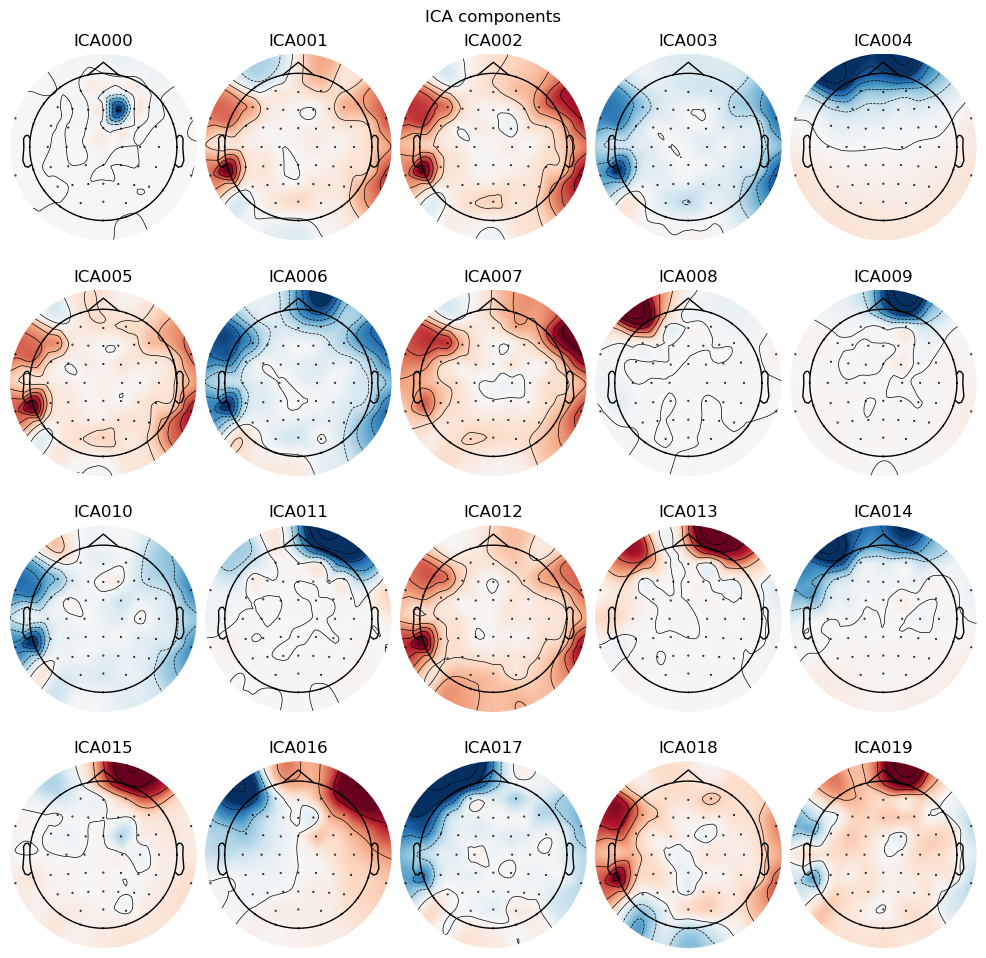

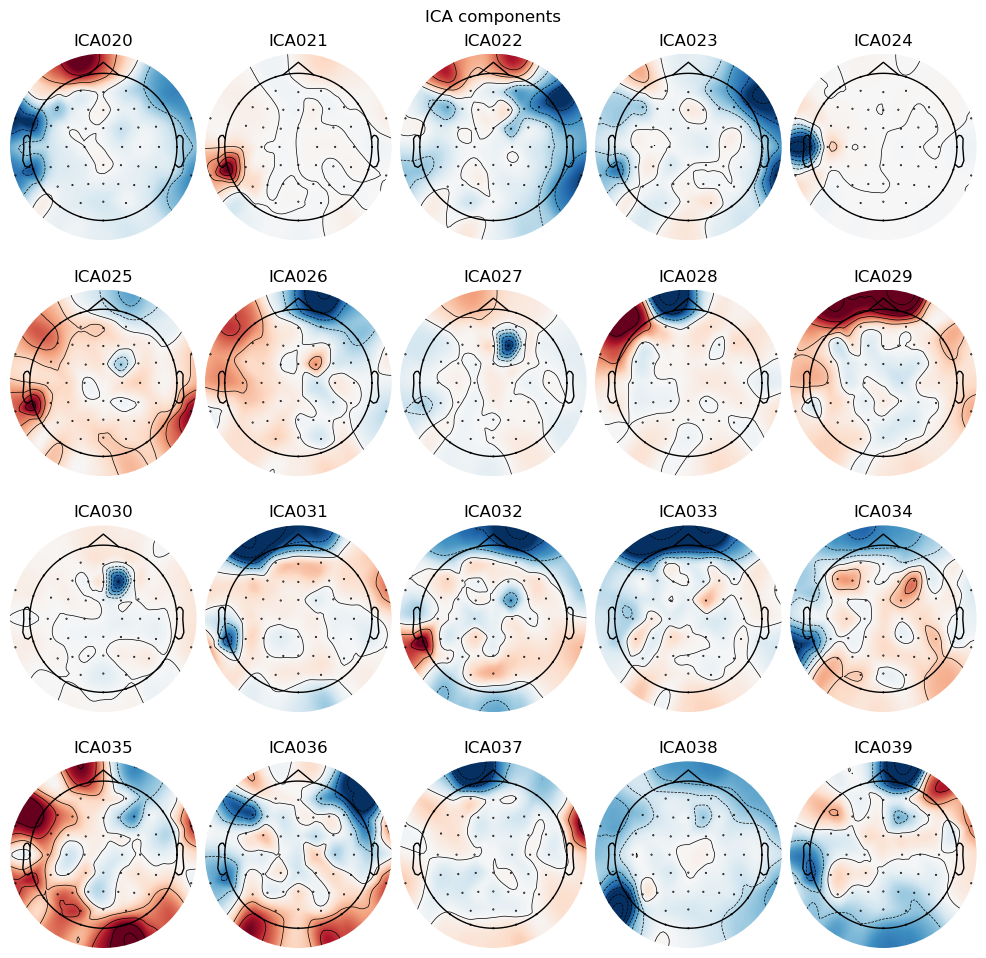

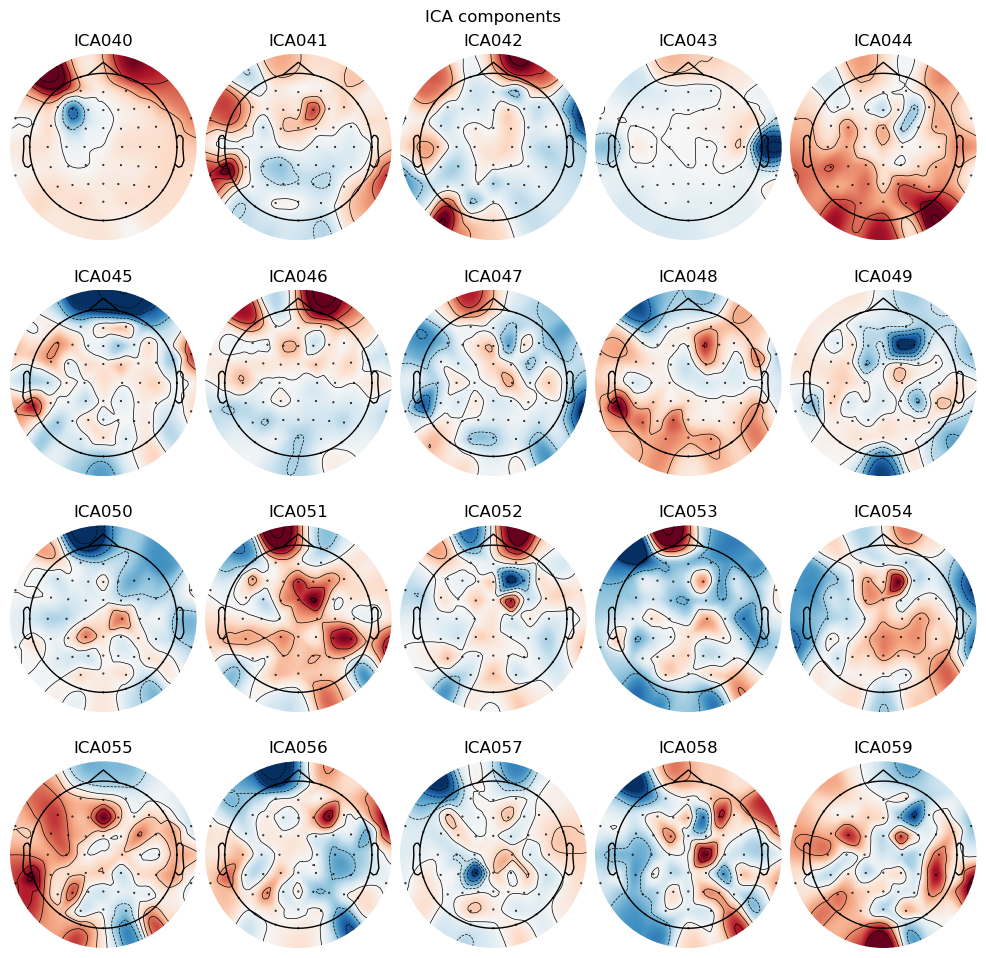

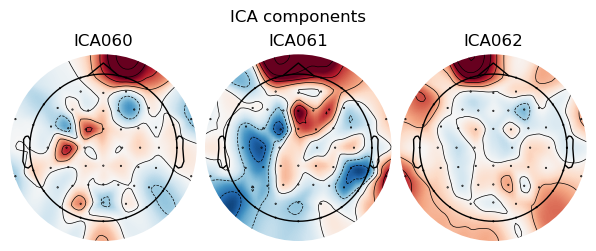

In [32]:
%matplotlib inline
ica = mne.preprocessing.ICA(n_components=63, max_iter="auto", random_state=97)
ica.fit(raw)
ica.plot_components()
# ica.plot_sources(raw, show_scrollbars=False)
plt.show()

Creating RawArray with float64 data, n_channels=63, n_times=145551
    Range : 0 ... 145550 =      0.000 ...   568.555 secs
Ready.


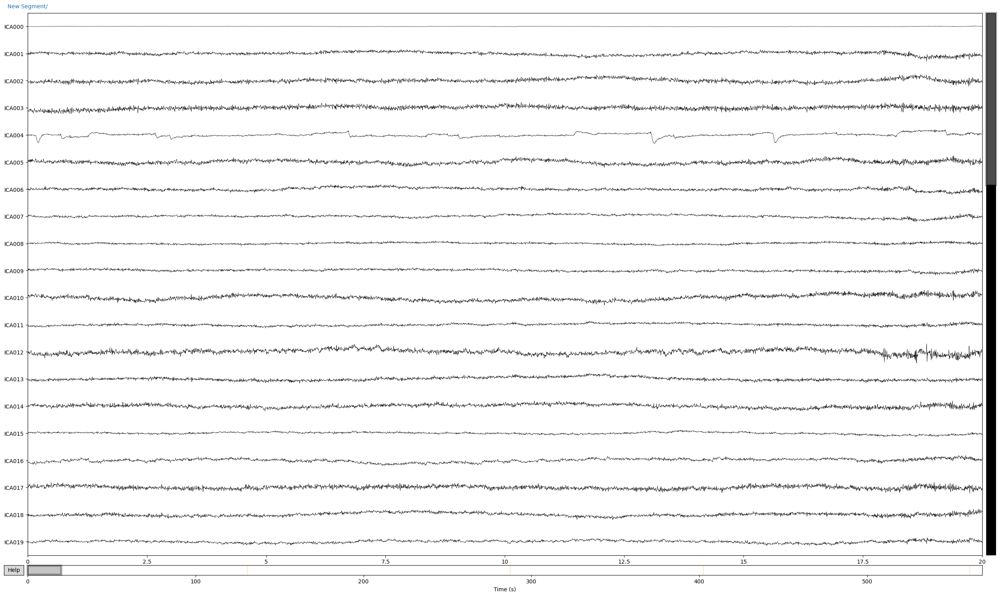

In [33]:
ica.plot_sources(raw)
plt.show()

In [34]:
ica.exclude = [0,8,20,24,39]
raw_clean = ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (63 components)
    Zeroing out 5 ICA components
    Projecting back using 63 PCA components


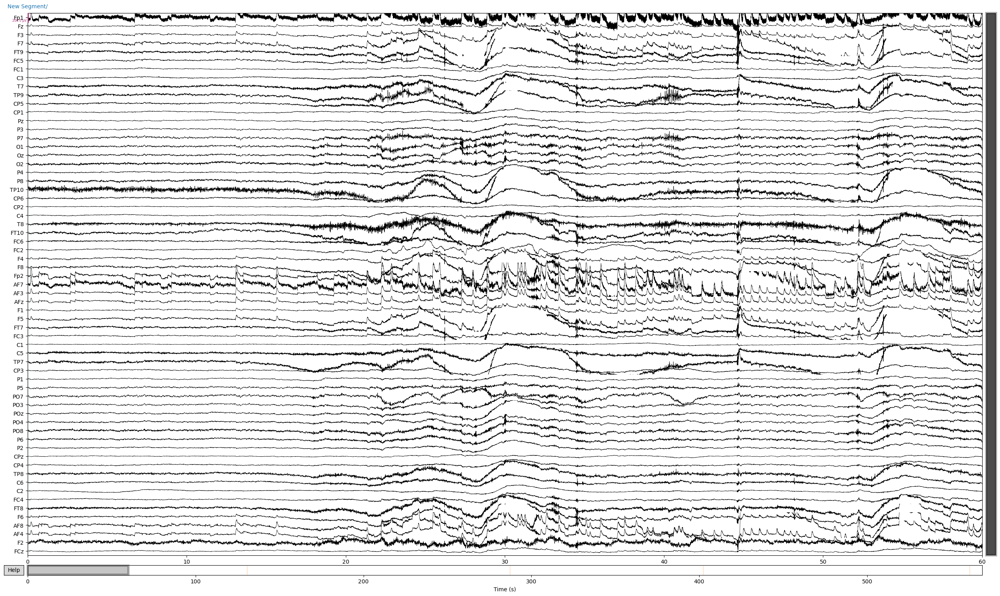

In [35]:
raw.plot(duration=60, proj=False, n_channels=len(raw.ch_names), remove_dc=True, scalings={'eeg': 1e-4})
plt.show()

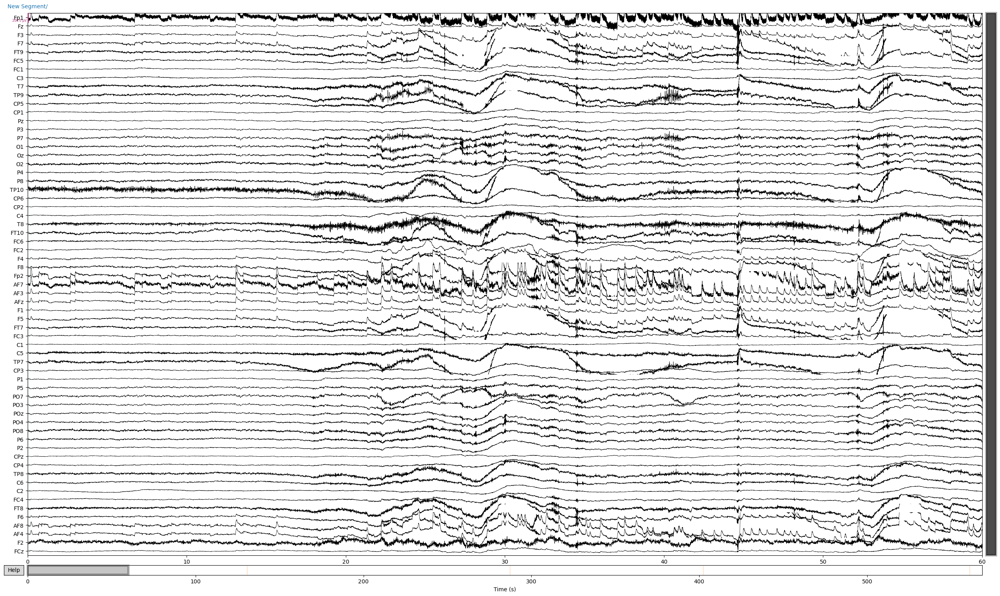

In [36]:
raw_clean.plot(duration=60, proj=False, n_channels=len(raw.ch_names), remove_dc=True, scalings={'eeg': 1e-4})
plt.show()

In [37]:
raw.info['bads'] = ['Fp1', 'TP10', 'T8', 'C5', 'T7']
print(raw.info['bads'])
raw.interpolate_bads()

['Fp1', 'TP10', 'T8', 'C5', 'T7']
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 5 sensors


<RawBrainVision | driving_EEG.eeg, 63 x 145551 (568.6 s), ~70.1 MB, data loaded>

In [38]:
raw.set_eeg_reference('average', projection=True).apply_proj() 

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...


<RawBrainVision | driving_EEG.eeg, 63 x 145551 (568.6 s), ~70.1 MB, data loaded>

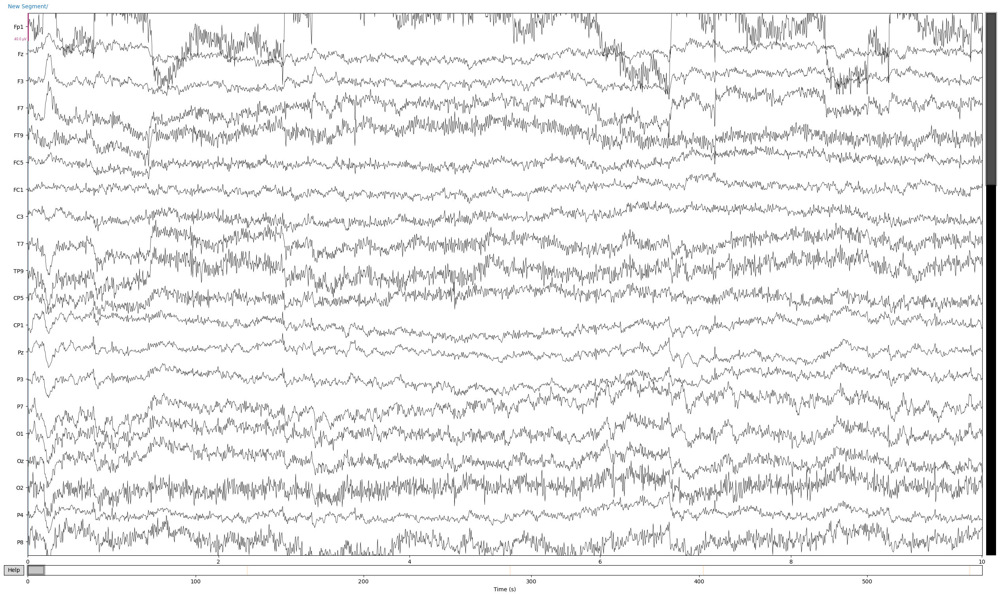

In [39]:
fig = raw.plot()
with mne.viz.use_browser_backend("matplotlib"):
    fig.subplots_adjust(top=0.9)
    fig.suptitle(f"Band-pass filtered at {0.1} - {75} Hz", size="xx-large", weight="bold")
    plt.show()

Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).


c:\Users\zxzhang\Software\Anaconda3\envs\py310\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


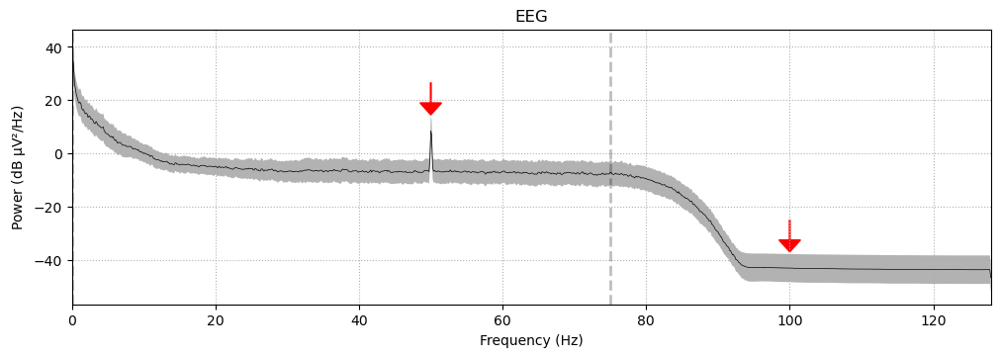

In [40]:
def add_arrows(axes):
    """Add some arrows at 60 Hz and its harmonics."""
    for ax in axes:
        freqs = ax.lines[-1].get_xdata()
        psds = ax.lines[-1].get_ydata()
        for freq in (50, 100):
            idx = np.searchsorted(freqs, freq)
            # get ymax of a small region around the freq. of interest
            y = psds[(idx - 4) : (idx + 5)].max()
            ax.arrow(x=freqs[idx],
                     y=y + 18,
                     dx=0,
                     dy=-12,
                     color="red",
                     width=0.1,
                     head_width=3,
                     length_includes_head=True)
fig = raw.compute_psd().plot(average=True, amplitude=False, picks="data", exclude="bads")
add_arrows(fig.axes[:2])
plt.show()

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1691 samples (6.605 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).


c:\Users\zxzhang\Software\Anaconda3\envs\py310\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


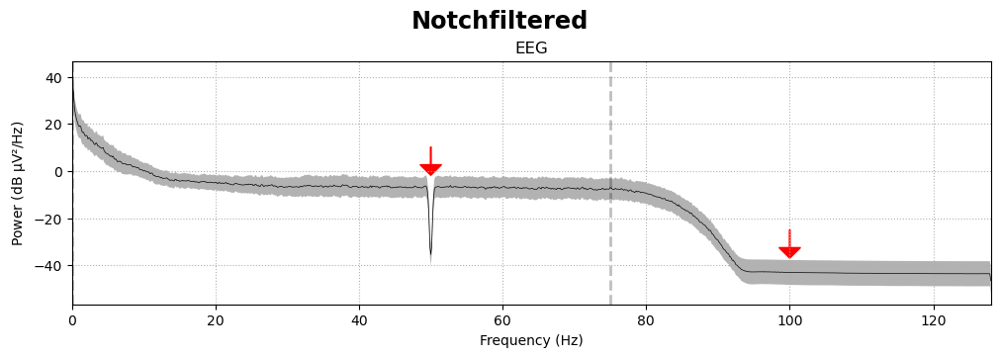

In [41]:
# notch filter
eeg_picks = mne.pick_types(raw.info, meg=False, eeg=True)
freqs = (50, 100)
raw.notch_filter(freqs=freqs, picks=eeg_picks)
fig = raw.compute_psd().plot(average=True, amplitude=False, picks="data", exclude="bads")
fig.suptitle(f"Notchfiltered", size="xx-large", weight="bold")
add_arrows(fig.axes[:2])
plt.show()

In [42]:
# raw.save('../2_preprocessed/Preprocessed_driving_run2_data/Preprocessed_session2.fif', overwrite=True)